In [1]:
import mooda as md

In [2]:
# Location of your data file
path = '~/Documentos/datos/ilian/microcat.csv'

# Read data

In [3]:
import pandas as pd

df = pd.read_csv(path)

# Format the dataframe following the standard OceanSites
# 1. Rename columns
df.rename(
    columns={
        'Salinity': 'PSAL',
        'Temperature': 'TEMP',
        'Conductivity': 'CNDC'},
    inplace=True)
df['TIME'] = pd.to_datetime(df['d_stamp'] + ' ' + df['t_stamp'])
df['DEPTH'] = 0  # Write here the depth of the sensor

# 2. Delete not used columns
del df['threshold']
del df['const_err']
del df['d_stamp']
del df['t_stamp']

# 3. Add QC columns
df['TIME_QC'] = 1  # It means good data
df['DEPTH_QC'] = 7  # It means that you have written the depth
df['PSAL_QC'] = 0  # It means, no QC test yet
df['TEMP_QC'] = 0
df['CNDC_QC'] = 0

# 4. Set index
df.set_index(['DEPTH', 'TIME'], inplace=True)

df

PSAL     CNDC     TEMP  TIME_QC  DEPTH_QC  \
DEPTH TIME                                                                
0     2017-07-24 05:31:16   0.3278  0.07108  27.7290        1         7   
      2017-07-24 16:01:19   0.0134  0.00004  29.4220        1         7   
      2017-07-24 16:31:17   0.0133  0.00004  29.0050        1         7   
      2017-07-24 17:01:15   0.0132  0.00004  28.7131        1         7   
      2017-07-24 17:31:17   0.0131  0.00004  28.5829        1         7   
...                            ...      ...      ...      ...       ...   
      2019-12-24 18:01:12  39.0485  5.38685  20.9416        1         7   
      2019-12-24 19:01:11  39.0575  5.38110  20.8806        1         7   
      2019-12-24 20:01:12  39.0573  5.37603  20.8356        1         7   
      2019-12-24 21:01:14  39.0287  5.36194  20.7411        1         7   
      2019-12-24 22:01:14  39.0219  5.36252  20.7537        1         7   

                           PSAL_QC  TEMP_QC  CNDC_QC  
DEPTH TIME                                            
0     2017-07-24 05:31:16        0        0        0  
      2017-07-24 16:01:19        0        0        0  
      2017-07-24 16:31:17        0        0        0  
      2017-07-24 17:01:15        0        0        0  
      2017-07-24 17:31:17        0        0        0  
...                            ...      ...      ...  
      2019-12-24 18:01:12        0        0        0  
      2019-12-24 19:01:11        0        0        0  
      2019-12-24 20:01:12        0        0        0  
      2019-12-24 21:01:14        0        0        0  
      2019-12-24 22:01:14        0        0        0  

[25941 rows x 8 columns]

# Add metadata information

This is optional, but always helps to remember whay you are using this datafile.
Check oficial OceanSites fields [here](https://github.com/rbardaji/mooda/blob/master/docs/examples/wf_oceansite.md).

In [4]:
metadata = {}

# Example of metadata information
metadata['sensor'] = 'Sea-Bird CTD'
metadata['title'] = 'Data from the campaign XXX from YYY'
metadata['principal_investigator'] = 'a name'
metadata['contact_email'] = 'an email'

# Add vocabulary information

Optional, but recommended

In [5]:
vocabulary = {
    'TIME': {
        'standard_name': 'time',
        'units': 'number of seconds that have elapsed since January 1, 1970 (midnight UTC/GMT)',
        'axis': 'T',
        'long_name': 'time of measurement',
        'valid_min': -9223372036854775808,
        'valid_max': 9223372036854775808,
        'QC_indicator': 'good data',
        'processing_level': 'Raw instrument data',
        'uncertainty': 'nan',
        'comment': 'Time is going be visualized as YYYY/MM/DD hh:mm:ss'},
    'TIME_QC': {
        'long_name': 'quality flag for TIME',
        'flag_values': [0, 1, 2, 3, 4, 7, 8, 9],
        'flag_meanings': 'unknown good_data probably_good_data potentially_correctable_bad_data' \
            'bad_data nominal_value interpolated_value missing_value'},
    'DEPTH': {
        'standard_name': 'depth',
        'units': 'meters',
        'positive': 'down',
        'axis': 'Z',
        'reference': 'sea_level',
        'coordinate_reference_frame': 'urn:ogc:def:crs:EPSG::5831',
        'long_name': 'Depth of measurement',
        '_FillValue': 'nan',
        'valid_min': -10,
        'valid_max': 12000,
        'QC_indicator': 'unknown',  # CAUTION: THIS IS THE QC LABEL OF THE DEPTH INFORMATION
        'processing_level': 'Raw instrument data',
        'uncertainty': 'nan',
        'comment': 'Depth calculated from the sea surface'},
    'DEPTH_QC': {
        'long_name': 'quality flag for DEPTH',
        'flag_values': [0, 1, 2, 3, 4, 7, 8, 9],
        'flag_meanings': 'unknown good_data probably_good_data potentially_correctable_bad_data' \
            'bad_data nominal_value interpolated_value missing_value'},
    'CNDC': {
        'standard_name': 'conductivity',
        'units': 'mS-1 (example, write here the units))',
        'long_name': 'Conductivity of sea water',
        'QC_indicator': 'Good data',
        'processing_level': 'Raw instrument data'},
    'CNDC_QC': {
        'long_name': 'quality flag for TEMP',
        'flag_values': [0, 1, 2, 3, 4, 7, 8, 9],
        'flag_meanings': 'unknown good_data probably_good_data potentially_correctable_bad_data' \
            'bad_data nominal_value interpolated_value missing_value'},
    'TEMP': {
        'standard_name': 'Sea water temperature',
        'units': 'celsius degree',
        'long_name': 'Sea water temperature',
        'QC_indicator': 'Good data',
        'processing_level': 'Raw instrument data'},
    'TEMP_QC': {
        'long_name': 'quality flag for TEMP',
        'flag_values': [0, 1, 2, 3, 4, 7, 8, 9],
        'flag_meanings': 'unknown good_data probably_good_data potentially_correctable_bad_data' \
            'bad_data nominal_value interpolated_value missing_value'},
    'PSAL': {
        'standard_name': 'Salinity',
        'units': 'PSU',
        'long_name': 'Salinity of water',
        'QC_indicator': 'Good data',
        'processing_level': 'Raw instrument data'},
    'PSAL_QC': {
        'long_name': 'quality flag for PSAL',
        'flag_values': [0, 1, 2, 3, 4, 7, 8, 9],
        'flag_meanings': 'unknown good_data probably_good_data potentially_correctable_bad_data' \
            'bad_data nominal_value interpolated_value missing_value'}}

# Make a WaterFrame

In [6]:
import mooda as md

wf = md.WaterFrame()
wf.data = df
wf.metadata = metadata
wf.vocabulary = vocabulary

wf

Memory usage: 1.906 MBytes
Parameters:
  - PSAL: Salinity of water (PSU)
    - Min value: 0.0126
      - DEPTH: 0
      - TIME: 2017-07-25 02:01:15
    - Max value: 39.9832
      - DEPTH: 0
      - TIME: 2018-10-10 10:31:13
    - Mean value: 39.23420749778343
  - CNDC: Conductivity of sea water (mS-1 (example, write here the units)))
    - Min value: 2.9999999999999997e-05
      - DEPTH: 0
      - TIME: 2018-09-02 00:01:13
    - Max value: 6.597639999999999
      - DEPTH: 0
      - TIME: 2017-08-17 11:31:16
    - Mean value: 5.886525169422921
  - TEMP: Sea water temperature (celsius degree)
    - Min value: 16.7942
      - DEPTH: 0
      - TIME: 2019-04-02 07:01:12
    - Max value: 38.2488
      - DEPTH: 0
      - TIME: 2017-07-25 08:31:15
    - Mean value: 25.084420122585865

## Explore data

For example, explore temperature data

In [11]:
fig = wf.iplot('TEMP', color=None, facet_col=None)
fig.show()

In [8]:
fig = wf.iplot('TEMP', plot_type='histogram')
fig.show()

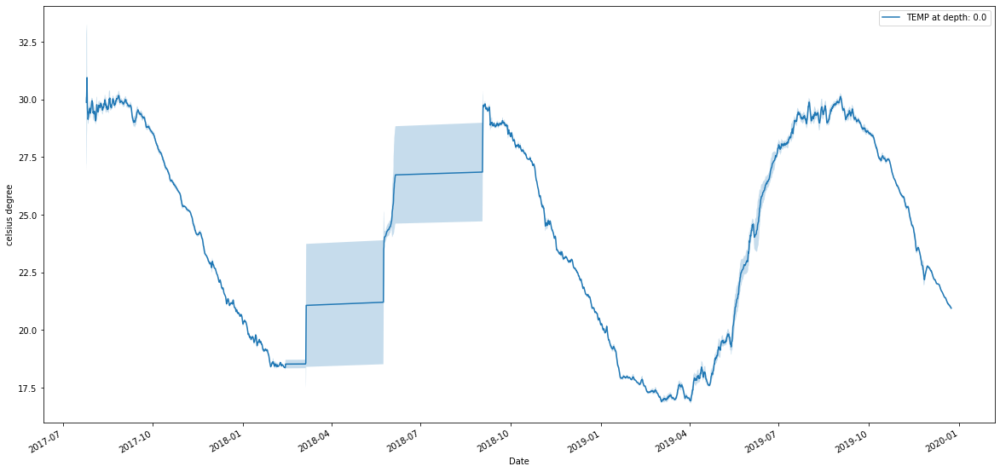

In [10]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))

# Not interactive plot
fig = wf.plot_timeseries('TEMP')
plt.show()

### Apply QC

Check the API documentation for mor information about the QC algorithms.

In [15]:
wf.qc_range_test()
wf.qc_flat_test()
wf.qc_spike_test()
wf.qc_replace()

True

## Explore data again

In [18]:
fig = wf.iplot('TEMP',facet_col=None)
fig.show()


Note that there spots that seems good data (QC = 1) but the QC test marked them as incorrect (QC = 4). This is due to we are using generic QC Test with all the default parameters. You should know which quality control test and which parameters are suitable for your data set. If you want, I can show you how to implement them with mooda.